### References:

- [Verifying safety of an autonomous spacecraft rendezvous mission. Nicole Chan, Sayan Mitra
](https://arxiv.org/abs/1703.06930)
- 

In [38]:
using Revise
using ReachabilityAnalysis, SparseArrays, Plots
const RA = ReachabilityAnalysis

ReachabilityAnalysis

In [19]:
function spacecraft(; abort_time=-1,
                      aborting::Bool=false)
    # variables
    x = 1   # x position (negative!)
    y = 2   # y position (negative!)
    vx = 3  # x velocity
    vy = 4  # y velocity
    t = 5   # time

    # number of variables
    n = 4 + 1

    # flag for activating the "rendezvous abort" scenario
    if aborting
        t_abort_lower, t_abort_upper = abort_time
    end

    # discrete structure (graph)
    automaton = LightAutomaton(aborting ? 3 : 2)

    # common vector of affine dynamics
    b = sparsevec([t], [1.], n)

    # mode 1 ("approaching")
    A = spzeros(n, n)
    A[x, vx] = 1.
    A[y, vy] = 1.
    A[vx, x] = -0.057599765881773
    A[vx, y] = 0.000200959896519766
    A[vx, vx] = -2.89995083970656
    A[vx, vy] = 0.00877200894463775
    A[vy, x] = -0.000174031357370456
    A[vy, y] = -0.0665123984901026
    A[vy, vx] = -0.00875351105536225
    A[vy, vy] = -2.90300269286856
    invariant = HalfSpace(sparsevec([x], [1.], n), -100.)  # x <= -100
    if aborting
        invariant = HPolyhedron([
            invariant,
            HalfSpace(sparsevec([t], [1.], n), t_abort_upper)  # t <= t_abort_upper
           ])
    end
    m_1 = @system(x' = Ax + b, x ∈ invariant)

    # mode 2 ("rendezvous attempt")
    A = spzeros(n, n)
    A[x, vx] = 1.
    A[y, vy] = 1.
    A[vx, x] = -0.575999943070835
    A[vx, y] = 0.000262486079431672
    A[vx, vx] = -19.2299795908647
    A[vx, vy] = 0.00876275931760007
    A[vy, x] = -0.000262486080737868
    A[vy, y] = -0.575999940191886
    A[vy, vx] = -0.00876276068239993
    A[vy, vy] = -19.2299765959399
    invariant = HPolyhedron([
        HalfSpace(sparsevec([x], [-1.], n), 100.),           # x >= -100
        HalfSpace(sparsevec([x], [1.], n), 100.),            # x <= 100
        HalfSpace(sparsevec([y], [-1.], n), 100.),           # y >= -100
        HalfSpace(sparsevec([y], [1.], n), 100.),            # y <= 100
        HalfSpace(sparsevec([x, y], [-1., -1.], n), 141.1),  # x + y >= -141.1
        HalfSpace(sparsevec([x, y], [1., 1.], n), 141.1),    # x + y <= 141.1
        HalfSpace(sparsevec([x, y], [1., -1.], n), 141.1),   # -x + y >= -141.1
        HalfSpace(sparsevec([x, y], [-1., 1.], n), 141.1)    # -x + y <= 141.1
       ])
    if aborting
        addconstraint!(invariant, HalfSpace(sparsevec([t], [1.], n), t_abort_upper))  # t <= t_abort_upper
    end
    
    m_2 = @system(x' = Ax + b, x ∈ invariant)

    # mode 3 ("aborting")
    A = spzeros(n, n)
    A[x, vx] = 1.
    A[y, vy] = 1.
    A[vx, x] = 0.0000575894721132
    A[vx, vy] = 0.00876276
    A[vy, vx] = -0.00876276
    invariant = Universe(n)
    
    m_3 = @system(x' = Ax + b, x ∈ invariant)

    # modes
    modes = aborting ? [m_1, m_2, m_3] : [m_1, m_2]

    # transition 1 -> 2
    add_transition!(automaton, 1, 2, 1)
    guard = HPolyhedron([
        HalfSpace(sparsevec([x], [-1.], n), 100.),           # x >= -100
        HalfSpace(sparsevec([x], [1.], n), 100.),            # x <= 100
        HalfSpace(sparsevec([y], [-1.], n), 100.),           # y >= -100
        HalfSpace(sparsevec([y], [1.], n), 100.),            # y <= 100
        HalfSpace(sparsevec([x, y], [-1., -1.], n), 141.1),  # x + y >= -141.1
        HalfSpace(sparsevec([x, y], [1., 1.], n), 141.1),    # x + y <= 141.1
        HalfSpace(sparsevec([x, y], [1., -1.], n), 141.1),   # -x + y >= -141.1
        HalfSpace(sparsevec([x, y], [-1., 1.], n), 141.1)    # -x + y <= 141.1
       ])
    t1 = ConstrainedIdentityMap(n, guard) # @map(x->x, dim:n, x ∈ guard)

    # TODO the SpaceEx model is missing the transition from 2 to 1

    if aborting
        add_transition!(automaton, 1, 3, 2)
        guard = HalfSpace(sparsevec([t], [-1.], n), -t_abort_lower)  # t >= t_abort_lower
        t2 = ConstrainedIdentityMap(n, guard)

        add_transition!(automaton, 2, 3, 3)
        guard = HalfSpace(sparsevec([t], [-1.], n), -t_abort_lower)  # t >= t_abort_lower
        t3 = ConstrainedIdentityMap(n, guard)
    end

    # transition annotations
    resetmaps = aborting ? [t1, t2, t3] : [t1]

    H = HybridSystem(automaton=automaton, modes=modes, resetmaps=resetmaps)

    # initial condition in mode 1
    X0 = Hyperrectangle([-900., -400., 0., 0., 0.],
                        [25., 25., 0., 0., 0.])
    initial_condition = [(1, X0)]

    system = InitialValueProblem(H, initial_condition)

    return system
end

    #=
    
    # safety property in "Mode 2"
    velocity = 0.055 * 60.  # meters per minute
    cx = velocity * cos(π / 8)  # x-coordinate of the octagon's first (ENE) corner
    cy = velocity * sin(π / 8)  # y-coordinate of the octagon's first (ENE) corner
    octagon = [
        HalfSpace(sparsevec([vx], [-1.], n), cx),                # vx >= -cx
        HalfSpace(sparsevec([vx], [1.], n), cx),                 # vx <= cx
        HalfSpace(sparsevec([vy], [-1.], n), cx),                # vy >= -cx
        HalfSpace(sparsevec([vy], [1.], n), cx),                 # vy <= cx
        HalfSpace(sparsevec([vx, vy], [1., 1.], n), cy + cx),    # vx + vy <= cy + cx
        HalfSpace(sparsevec([vx, vy], [1., -1.], n), cy + cx),   # vx - vy <= cy + cx
        HalfSpace(sparsevec([vx, vy], [-1., 1.], n), cy + cx),   # -vx + vy <= cy + cx
        HalfSpace(sparsevec([vx, vy], [-1., -1.], n), cy + cx)   # -vx - vy <= cy + cx
       ]
    tan30 = tan(π/6)
    cone = [
        HalfSpace(sparsevec([x], [-1.], n), 100.),          # x >= -100
        HalfSpace(sparsevec([x, y], [tan30, -1.], n), 0.),  # -x tan(30°) + y >= 0
        HalfSpace(sparsevec([x, y], [tan30, 1.], n), 0.),   # -x tan(30°) - y >= 0
       ]
    property_rendezvous = is_contained_in(HPolytope([octagon; cone])) #octagon ⊆ cone
    
    # safety property in "aborting"
    target = HPolytope([
        HalfSpace(sparsevec([x], [-1.], n), 0.2),  # x >= -0.2
        HalfSpace(sparsevec([x], [1.], n), 0.2),   # x <= 0.2
        HalfSpace(sparsevec([y], [-1.], n), 0.2),  # y >= -0.2
        HalfSpace(sparsevec([y], [1.], n), 0.2),   # y <= 0.2
       ])
    property_aborting = is_disjoint_from(target) # ?
    # safety properties
    property = Dict{Int, Property}(2 => property_rendezvous,
                                   3 => property_aborting)

    # default options
    options = Options(:T=>300., :property=>property)
    =#



spacecraft (generic function with 1 method)

In [17]:
using Plots

## Invariant in the "approaching" mode

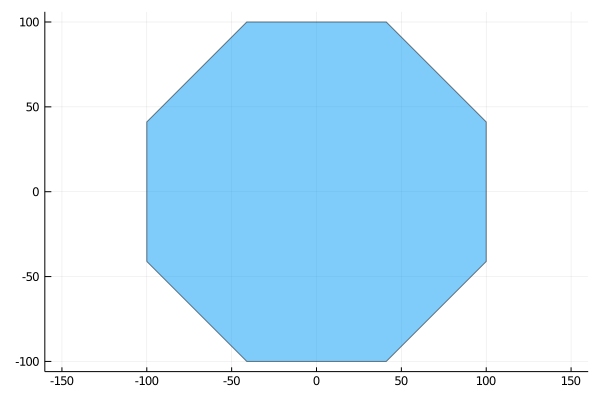

In [11]:
n = 2
x = 1  # x position (negative!)
y = 2  # y position (negative!)
invariant = HPolytope([
        HalfSpace(sparsevec([x], [-1.], n), 100.),           # x >= -100
        HalfSpace(sparsevec([x], [1.], n), 100.),            # x <= 100
        HalfSpace(sparsevec([y], [-1.], n), 100.),           # y >= -100
        HalfSpace(sparsevec([y], [1.], n), 100.),            # y <= 100
        HalfSpace(sparsevec([x, y], [-1., -1.], n), 141.1),  # x + y >= -141.1
        HalfSpace(sparsevec([x, y], [1., 1.], n), 141.1),    # x + y <= 141.1
        HalfSpace(sparsevec([x, y], [1., -1.], n), 141.1),   # -x + y >= -141.1
        HalfSpace(sparsevec([x, y], [-1., 1.], n), 141.1)    # -x + y <= 141.1
       ])
plot(invariant, ratio=1)

## Dynamics in the "approaching" -> "rendez-vous" transition

In [27]:
prob = spacecraft();
H = system(prob);
q0, X0 = initial_state(prob)[1];

In [33]:
prob_approaching = IVP(mode(H, 1), X0);
sol = solve(prob_approaching, tspan=(0.0, 200.0), alg=GLGM06(δ=0.01));

In [34]:
stateset(prob_approaching)

HalfSpace{Float64,SparseVector{Float64,Int64}}(  [1]  =  1.0, -100.0)

In [35]:
plot(sol, vars=(1, 2), lw=0.0)

In [120]:
sol = solve(prob, tspan=(0.0, 200.0), max_jumps=1,
            alg=BOX(δ=0.01),
            intersect_source_invariant=false,
            clustering=RA.BoxClustering());

In [105]:
plot(sol[1], vars=(1, 2), color=:lightblue, lw=0.0)
plot!(sol[2], vars=(1, 2), color=:red, lw=0.0)

**Next meeting: wednesday 11am mexican time** (13pm Uruguay - 18hs Austria)

- Why do i need to load Polyhedra (for `vertices_list`) for the disjointness check of a zonotope and a polyhedron?

In [68]:
Z = rand(Zonotope, dim=6);
P = convert(HPolyhedron, rand(Hyperrectangle, dim=6));

In [69]:
RA._is_intersection_empty(Z, P)

false

```
_is_intersection_empty fallo con X = ReachSet{Float64,Zonotope{Float64,Array{Float64,1},Array{Float64,2}}}(Zonotope{Float64,Array{Float64,1},Array{Float64,2}}([-738.5314513734181, -318.32898665881555, 14.77100354391039, 7.351642191856789, 10.234999999999827], [20.518902973823113 0.0003906240272600033 0.07582614240579816 0.00012405612106377255 0.0; -0.0003507991267528678 19.89993572140967 -0.00022508111464222916 0.039296757174470114 0.0; -0.4103834107412812 -1.9183992308866257e-5 -0.001516542495414025 -2.503610099353198e-6 0.0; 1.5571708337447854e-5 -0.4595954609297282 5.2259256841742734e-6 -0.000907571289972665 0.0; 0.0 0.0 0.0 0.0 0.005]), [10.2299, 10.2401]), G = HPolyhedron{Float64,SparseVector{Float64,Int64}}(HalfSpace{Float64,SparseVector{Float64,Int64}}[HalfSpace{Float64,SparseVector{Float64,Int64}}(  [1]  =  -1.0, 100.0), HalfSpace{Float64,SparseVector{Float64,Int64}}(  [1]  =  1.0, 100.0), HalfSpace{Float64,SparseVector{Float64,Int64}}(  [2]  =  -1.0, 100.0), HalfSpace{Float64,SparseVector{Float64,Int64}}(  [2]  =  1.0, 100.0), HalfSpace{Float64,SparseVector{Float64,Int64}}(  [1]  =  -1.0
  [2]  =  -1.0, 141.1), HalfSpace{Float64,SparseVector{Float64,Int64}}(  [1]  =  1.0
  [2]  =  1.0, 141.1), HalfSpace{Float64,SparseVector{Float64,Int64}}(  [1]  =  1.0
  [2]  =  -1.0, 141.1), HalfSpace{Float64,SparseVector{Float64,Int64}}(  [1]  =  -1.0
  [2]  =  1.0, 141.1)])

```

In [84]:
Zproblem = Zonotope([-738.5314513734181, -318.32898665881555, 14.77100354391039, 7.351642191856789, 10.234999999999827], [20.518902973823113 0.0003906240272600033 0.07582614240579816 0.00012405612106377255 0.0; -0.0003507991267528678 19.89993572140967 -0.00022508111464222916 0.039296757174470114 0.0; -0.4103834107412812 -1.9183992308866257e-5 -0.001516542495414025 -2.503610099353198e-6 0.0; 1.5571708337447854e-5 -0.4595954609297282 5.2259256841742734e-6 -0.000907571289972665 0.0; 0.0 0.0 0.0 0.0 0.005]);

In [83]:
t = first(out_transitions(H, 1));
transition = RA.DiscreteTransition(H, t);
G = guard(transition);

In [87]:
@which is_intersection_empty(Zproblem, G)

is_intersection_empty(P::AbstractPolyhedron{N}, Q::AbstractPolyhedron{N}) where N<:Real in LazySets at /home/mforets/.julia/dev/LazySets/src/ConcreteOperations/isdisjoint.jl:993

In [88]:
Zproblem

Zonotope{Float64,Array{Float64,1},Array{Float64,2}}([-738.5314513734181, -318.32898665881555, 14.77100354391039, 7.351642191856789, 10.234999999999827], [20.518902973823113 0.0003906240272600033 … 0.00012405612106377255 0.0; -0.0003507991267528678 19.89993572140967 … 0.039296757174470114 0.0; … ; 1.5571708337447854e-5 -0.4595954609297282 … -0.000907571289972665 0.0; 0.0 0.0 … 0.0 0.005])

## The same but using the nonlinear solver TMJets

In [115]:
prob_approaching = IVP(mode(H, 1), X0);
sol = solve(prob_approaching, tspan=(0.0, 100.0),
            alg=TMJets());

BoundsError: BoundsError: attempt to access 1-element Array{TaylorN{Float64},1} at index [2]

In [118]:
Matrix(system(prob_approaching).A)

5×5 Array{Float64,2}:
  0.0           0.0          1.0          0.0         0.0
  0.0           0.0          0.0          1.0         0.0
 -0.0575998     0.00020096  -2.89995      0.00877201  0.0
 -0.000174031  -0.0665124   -0.00875351  -2.903       0.0
  0.0           0.0          0.0          0.0         0.0

In [ ]:
@taylorize spacecraft!(....)